::# **Social Network Analysis**

Social network analysis (SNA) is the process of investigating social structures through the use of networks and graph theory. It characterizes networked structures in terms of nodes (individual actors, people, or things within the network) and the ties, edges, or links (relationships or interactions) that connect them. 

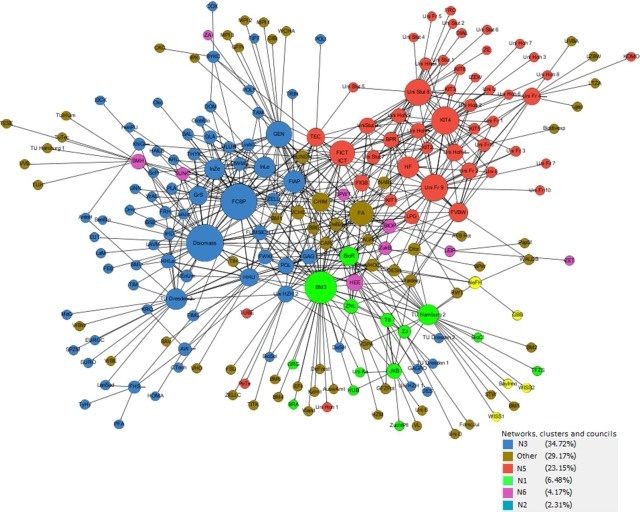

In [85]:
import pandas as pd
import networkx as nx
from matplotlib import pylab
import matplotlib.pyplot as plt
import seaborn as sns


In [50]:
!pip install anvil-uplink

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.4/51.4 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45228 sha256=25fbae2f609d341fdaf909f1ad9db1d0eb7caf63bc421300b4fc6152a5e4c622
  Stored in directory: /root/.cache/pip/wheels/2e/7c/ad/d9c746276bf024d44296340869fcb169f1e5d80fb147351a57
Successfully built ws4py


In [51]:
import anvil.server

anvil.server.connect("server_3T63VQH2UCT35AUDHTPA6WXX-MK5MUVL5KEYOJCAW")

Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Default Environment" as SERVER


# **Data Loading**

CSV file with the structure 

user: message author
replytoauthor: reply to another user

separator ;

utf-8


In [52]:
# import csv file
from google.colab import files
uploaded = files.upload()

Saving EN_EMAILS_Enron_10k-1.csv to EN_EMAILS_Enron_10k-1 (2).csv


In [53]:
import pandas as pd
import io

file_name = 'EN_EMAILS_Enron_10k-1.csv'
if file_name in uploaded:
    df = pd.read_csv(io.BytesIO(uploaded[file_name]), sep=';', encoding='utf8')
else:
    print(f"Error: {file_name} not found in uploaded files")

In [86]:
import io
df = pd.read_csv(io.BytesIO(uploaded['EN_EMAILS_Enron_10k-1.csv']), sep=';', encoding='utf8')
# Dataset is now stored in a Pandas Dataframe

In [87]:
# rename columns to lower case
df.columns= df.columns.str.lower()
df.columns

Index(['text', 'user', 'timestamp', 'nshares', 'nlikes', 'nfriends',
       'ncomments', 'replytoauthor'],
      dtype='object')

In [88]:
df.head()

,text,user,timestamp,nshares,nlikes,nfriends,ncomments,replytoauthor
0,"\n\nDave, \n\n Here are the names of the west ...",vid-delainey,970671910000,0,0,0,0,phillip-allen\n
1,"\n\nTim,\n\nmike grigsby is having problems wi...",m-heizenrader,988920310000,0,0,0,0,phillip-allen\n
2,"\n\nBrenda,\n\nPlease use the second check as ...",_stone-yahoo-com,970509130000,0,0,0,0,phillip-allen\n
3,"\n\nBrenda,\n\n Please use the second check as...",_stone-yahoo-com,970397890000,0,0,0,0,phillip-allen\n
4,"\n\nJim,\n\nIs there going to be a conference ...",mes-steffes,988751710000,0,0,0,0,phillip-allen\n


Filter users and replytoauthor

In [89]:
def constructEdgeListFromDict(messagesDF):
	'''
	Construct an EdgeList from the Data Acquistion results in dictionary form.	
	Parameters
	----------
	daResults : TYPE dict
		Data Acquisition Results in dict form.
	Returns
	-------
	Edgelist in DataFrame structure.
	'''
	
	# Subset to only have the needed data
	messagesDF = messagesDF[['user', 'replytoauthor']]
	
	# Remove unexisting edges (reply to is empty)
	edgesDF = messagesDF.dropna(subset=['replytoauthor'])
	
	# Process edges (group_by nickname, replytoauthor -> weight by occurrences)
	edgesDFWeight = edgesDF.groupby(['user', 'replytoauthor']).size().reset_index(name='weight')
	
	return(edgesDFWeight)

In [90]:
# create edge list
edgelistDF = constructEdgeListFromDict(df)

In [91]:
edgelistDF.head()

,user,replytoauthor,weight
0,*strauss,mjstrauss-nisource-com\n,1
1,-allen,michele-winckowski\n,1
2,-americas,shannon-daffern\n,1
3,-bug-pseg-com,gsmith3-keyspanenergy-com\n,1
4,-bugg-home-com,chris-dorland\n,1


In [92]:
# create graph
G = nx.from_pandas_edgelist(edgelistDF, source='user', target='replytoauthor', edge_attr='weight', create_using=nx.DiGraph)


In [93]:
# network size
G.size()

5516

In [99]:
!apt-get install -y graphviz libgraphviz-dev
!pip install graphviz networkx

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.42.2-3build2).
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk libxdot4
0 upgraded, 8 newly installed, 0 to remove and 24 not upgraded.
Need to get 2,148 kB of archives.
After this operation, 7,427 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 libgtk2.0-common all 2.24.32-4ubuntu4 [126 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/main amd64 libgtk2.0-0 amd64 2.24.32-4ubuntu4 [1,791 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/main amd64 libgail18 amd64 2.24.32-4ubuntu4 [14.7 kB]
Get:4 http://archive.ubuntu.com

**Plot the Graph**

In [100]:
import graphviz
import networkx as nx

def nx_to_graphviz(G):
    G_viz = graphviz.Digraph()
    for node in G.nodes():
        G_viz.node(str(node))

    for edge in G.edges(data=True):
        G_viz.edge(str(edge[0]), str(edge[1]), label=str(edge[2]['weight']))

    return G_viz

G_viz = nx_to_graphviz(G)

G_viz.graph_attr.update(rankdir='LR')
G_viz.node_attr.update(shape='circle', fontsize='10')
G_viz.edge_attr.update(arrowsize='0.5', fontsize='8')

G_viz.render('my_graph.gv', view=False, format='pdf')

'my_graph.gv.pdf'

In [101]:
from IPython.display import SVG

svg_data = G_viz.pipe(format='svg')
SVG(svg_data)

In [ ]:
def save_graph(graph,file_name):
    #initialze Figure
    plt.figure(num=None, figsize=(20, 20), dpi=80)
    plt.axis('off')
    fig = plt.figure(1)
    pos = nx.spring_layout(graph, k= 0.3)
    nx.draw_networkx_nodes(graph, pos, node_size=100)
    nx.draw_networkx_edges(graph,pos, width=0.1)
    nx.draw_networkx_labels(graph,pos, font_size=10, font_family='sans-serif')

    cut = 1.00
    xmax = cut * max(xx for xx, yy in pos.values())
    ymax = cut * max(yy for xx, yy in pos.values())
    plt.xlim(0, xmax)
    plt.ylim(0, ymax)

    plt.show()

    plt.savefig(file_name,bbox_inches="tight")
    pylab.close()
    del fig

#Assuming that the graph g has nodes and edges entered
save_graph(G,"my_graph.pdf")

#it can also be saved in .svg, .png. or .ps formats

Reconnecting Anvil Uplink...
Connecting to wss://anvil.works/uplink
Anvil websocket open
Fatal error from Anvil server: Incorrect uplink key
Anvil websocket closed (code 1000, reason=b'')
Reconnecting Anvil Uplink...
Connecting to wss://anvil.works/uplink
Anvil websocket open
Fatal error from Anvil server: Incorrect uplink key
Anvil websocket closed (code 1000, reason=b'')
Reconnecting Anvil Uplink...
Connecting to wss://anvil.works/uplink
Anvil websocket open
Fatal error from Anvil server: Incorrect uplink key
Anvil websocket closed (code 1000, reason=b'')


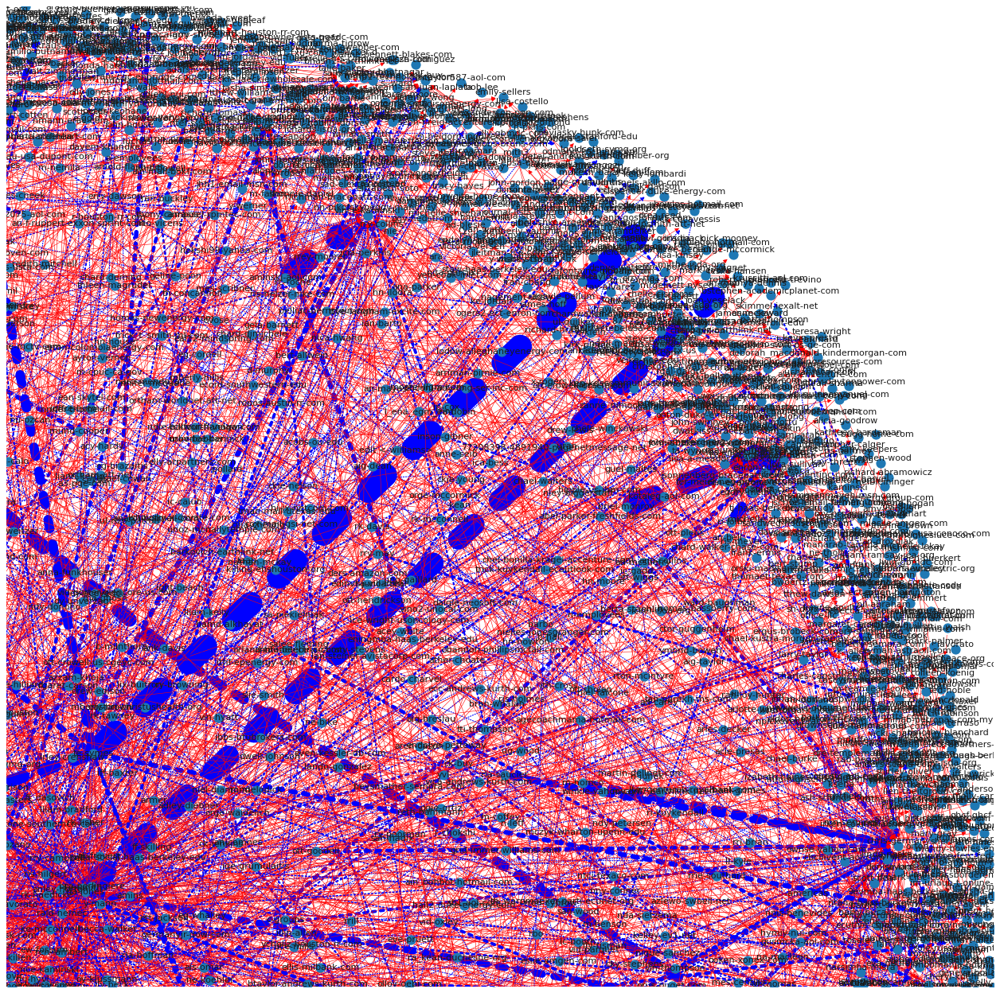

In [97]:
import networkx as nx
import matplotlib.pyplot as plt
import pylab

def save_graph(graph, file_name):
    plt.figure(num=None, figsize=(20, 20), dpi=80)
    plt.axis('off')
    fig = plt.figure(1)
    pos = nx.spring_layout(graph, k=0.3)

    # Draw nodes
    nx.draw_networkx_nodes(graph, pos, node_size=100)

    # Draw edges with different widths, colors, and styles based on 'weight' attribute
    for edge in graph.edges(data=True):
        width = edge[2]['weight'] * 0.5
        color = 'blue' if edge[2]['weight'] > 1 else 'red'
        style = 'dotted' if edge[2]['weight'] > 1 else 'solid'
        nx.draw_networkx_edges(graph, pos, edgelist=[(edge[0], edge[1])], width=width, edge_color=color, style=style)

    nx.draw_networkx_labels(graph, pos, font_size=10, font_family='sans-serif')

    cut = 1.00
    xmax = cut * max(xx for xx, yy in pos.values())
    ymax = cut * max(yy for xx, yy in pos.values())
    plt.xlim(0, xmax)
    plt.ylim(0, ymax)

    plt.show()

    plt.savefig(file_name, bbox_inches="tight")
    pylab.close()
    del fig

# Assuming that the graph G has nodes and edges entered
save_graph(G, "my_graph.pdf")

ValueError: ignored

In [63]:
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [64]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def save_graph2(graph, file_name):
    pos = nx.spring_layout(graph)
    for node in graph.nodes():
        graph.nodes[node]['pos'] = pos[node]
    fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter3d'}]])
    edge_x = []
    edge_y = []
    edge_z = []
    for edge in graph.edges():
        x0, y0 = graph.nodes[edge[0]]['pos']
        x1, y1 = graph.nodes[edge[1]]['pos']
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_z.extend([0, 0, None])
    edge_trace = go.Scatter3d(x=edge_x, y=edge_y, z=edge_z, mode='lines', line=dict(color='rgb(200,200,200)', width=1), hoverinfo='none')

    node_x = []
    node_y = []
    node_z = []
    for node in graph.nodes():
        x, y = graph.nodes[node]['pos']
        node_x.append(x)
        node_y.append(y)
        node_z.append(0)
    node_trace = go.Scatter3d(x=node_x, y=node_y, z=node_z, mode='markers', marker=dict(symbol='circle', size=6, color='rgb(0,0,255)', line=dict(color='rgb(50,50,50)', width=0.5)), text=list(graph.nodes()), hoverinfo='text')

    fig.add_trace(edge_trace)
    fig.add_trace(node_trace)
    fig.update_layout(title_text="3D Graph Visualization")
    fig.show()
    fig.write_image(file_name)

save_graph2(G,"my_graph_3d.pdf")

ValueError: ignored

In [65]:
def getNodesCommunity(communities):
	vertexComms = {}
	for com, com_vertices in enumerate(communities):
		for v in list(com_vertices):
			# vertexComms.append({'nickname': v, 'community': com})
			vertexComms[v] = com
	return(vertexComms)

In [66]:
def getGraphCommunities(G, seed = 42):
	
	# If only getting the largest component, the other components.
	# would be grouped in a community by themselves.
	# Using only for "large" graphs (100k nodes or above)
	#if(G.number_of_nodes() >= 100000):
	#	largestComponent = max(nx.weakly_connected_components(G), key=len) 
	#	G = G.subgraph(largestComponent)
	
	# Algorithm: Label Propagation. Con: Detects way too many comms. 
	# community_generator = community.asyn_lpa_communities(G, 'weight', seed = seed)
	# Algorithm: Modularity Maximization. Does not take into account direction of interactions.
	G_un = G.to_undirected() # Graph must be undirected.
	community_generator = nx.community.greedy_modularity_communities(G_un, 'weight')
	communities = sorted(community_generator, key=len, reverse=True)
	nodeComms = getNodesCommunity(communities)
	del G_un
	return(nodeComms)

In [67]:
def getNodesPageRank(G):
	pr = nx.pagerank(G, alpha = 0.85, weight = 'weight')
	return(pr)
	# result = [{'nickname': k, 'pagerank': pr[k]} for k in pr.keys()]
	#return (result)

In [68]:
def getNodesCentralityBetwenness(G):
  G_un = G.to_undirected() # Graph must be undirected.
  betweenness = nx.betweenness_centrality(G_un, weight = 'weight')
  return (betweenness)
	#result = [{'nickname': k, 'betweenness': betweenness[k]} for k in betweenness.keys()]
	#return (result)

In [69]:
def getNodesIndegreeOutdegree(G):
	inDeg = G.in_degree(weight='weight')
	outDeg = G.out_degree(weight='weight')
	vs = list(G.nodes)
	
	result = {v: inDeg[v]/(outDeg[v] + 1) for v in vs}
	return (result)

In [70]:
def socialNetworkAnalysisMetrics(G):
	'''
	Parameters
	----------
	G : TYPE graph from Igraph
		Must have weight attribute.
	Returns
	-------
	Social Networ Analysis DataFrame.
	'''
	print("[SNA] Starting Social Network Analysis")
	
	print("[SNA] Community detection: Modularity Maximization...")
	communities = getGraphCommunities(G)
	print('[SNA] Community detection: Modularity Maximization -- Done')	
	# printInfoAboutCommunities(infomap)
	
	print("[SNA] Centrality Measure: Page Rank...")
	pagerank = getNodesPageRank(G)
	print("[SNA] Centrality Measure: Page Rank -- Done")
	
	print("[SNA] Centrality Measure: Betweenness...")
	betweenness = getNodesCentralityBetwenness(G)
	print("[SNA] Centrality Measure: Betweenness -- Done")
	
	print("[SNA] Centrality Measure: Indegree/Outdegree...")
	inOut = getNodesIndegreeOutdegree(G)
	print("[SNA] Centrality Measure: Indegree/Outdegree -- Done")
	
	# Merge results
	print("[SNA] Merging results...")
	allResults = []
	for v in list(G.nodes):
		allResults.append(
			{'user': v,
			'pagerank': pagerank[str(v)],
			'community': communities[str(v)],
			'betweenness': betweenness[str(v)],
			'indegree_outdegree': inOut[str(v)]
			})
	print("[SNA] Merging results -- Done")
	del pagerank
	del communities
	del betweenness
	del inOut
	return(allResults)

In [71]:
result = socialNetworkAnalysisMetrics(G)

[SNA] Starting Social Network Analysis
[SNA] Community detection: Modularity Maximization...
[SNA] Community detection: Modularity Maximization -- Done
[SNA] Centrality Measure: Page Rank...
[SNA] Centrality Measure: Page Rank -- Done
[SNA] Centrality Measure: Betweenness...
[SNA] Centrality Measure: Betweenness -- Done
[SNA] Centrality Measure: Indegree/Outdegree...
[SNA] Centrality Measure: Indegree/Outdegree -- Done
[SNA] Merging results...
[SNA] Merging results -- Done


In [72]:
result[0:2]

[{'user': '*strauss',
  'pagerank': 0.0001419494261278891,
  'community': 105,
  'betweenness': 0.0,
  'indegree_outdegree': 0.0},
 {'user': 'mjstrauss-nisource-com\n',
  'pagerank': 0.00026305951086130796,
  'community': 105,
  'betweenness': 0.0,
  'indegree_outdegree': 1.0}]

In [73]:
# Convert JSON to DataFrame 
import json
jsonString = json.dumps(result)
df_result = pd.read_json(jsonString)

In [74]:
df_result.head()

,user,pagerank,community,betweenness,indegree_outdegree
0,*strauss,0.000142,105,0.0,0
1,mjstrauss-nisource-com\n,0.000263,105,0.0,1
2,-allen,0.000142,106,0.0,0
3,michele-winckowski\n,0.000263,106,0.0,1
4,-americas,0.000142,107,0.0,0


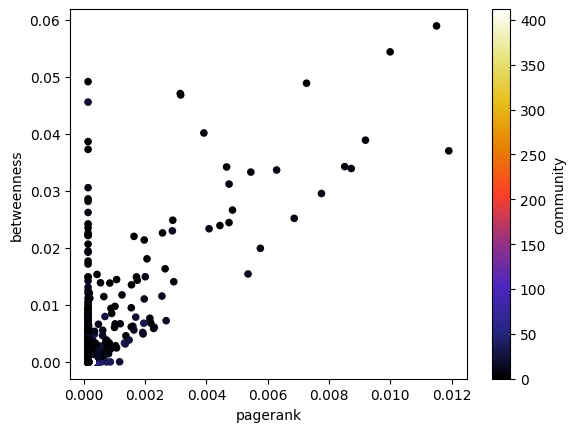

In [75]:
ax2 = df_result.plot.scatter(x='pagerank',
                      y='betweenness',
                      c='community',
                      colormap='CMRmap')

# **Disruption**

Disruption refers to the act of breaking ties in a network via multiple approaches so as to leave it disconnected. One can disrupt the network, effectively by focusing on the most important users, according to different, criteria and the goal to be achieved.

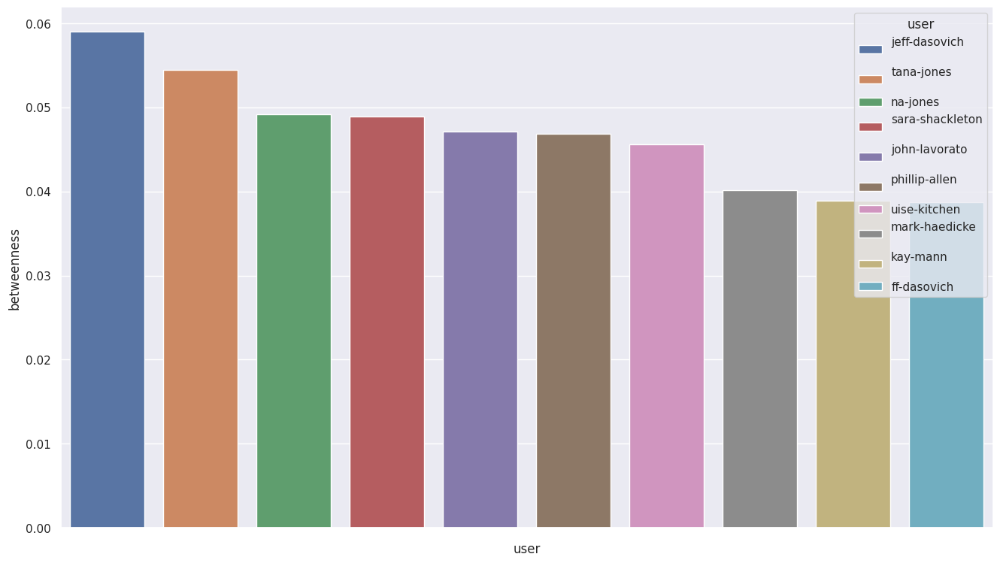

In [76]:
# Top Betweenness
# Users that act as amplifiers on the spread of information
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['betweenness'].sum().sort_values(by='betweenness', ascending=False).head(10)
sns.barplot(data=g, x='user', y='betweenness', hue='user', dodge=False).set(xticklabels=[]);



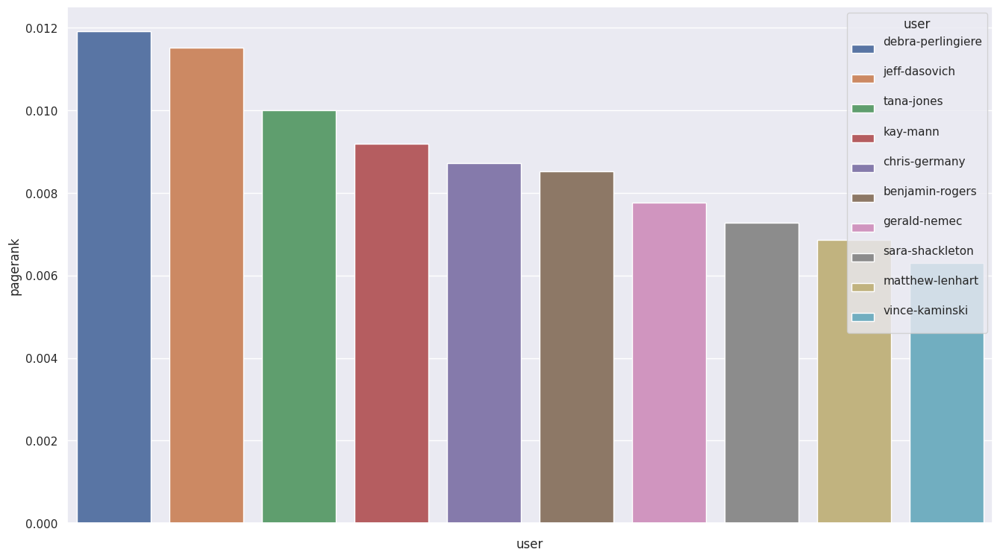

In [77]:
# TOP Page Rank
# Users whose opinion influence other people the most
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['pagerank'].sum().sort_values(by='pagerank', ascending=False).head(10)
sns.barplot(data=g, x='user', y='pagerank', hue='user', dodge=False).set(xticklabels=[]);


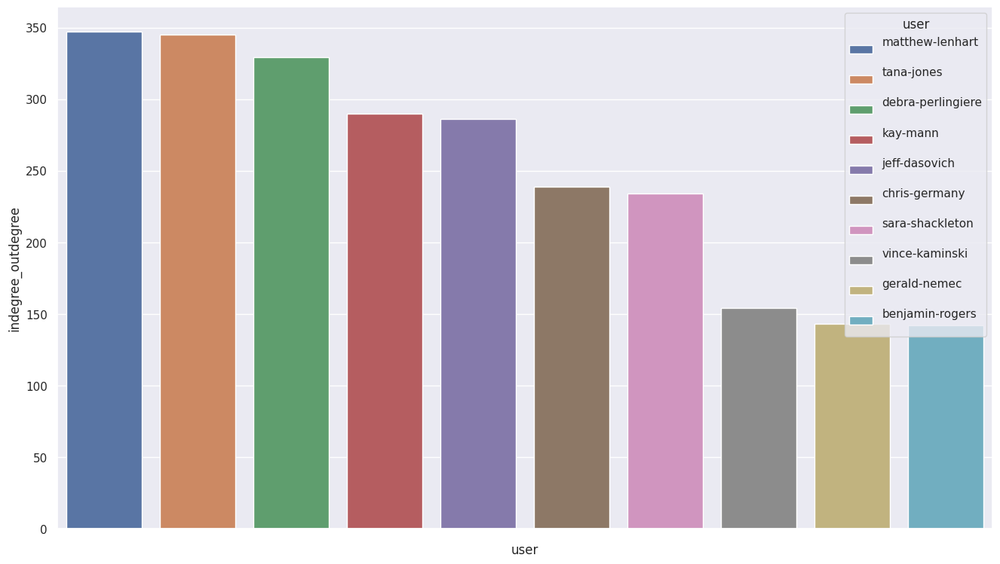

In [78]:
# TOP Interactions
# Users with the most observed interactions
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['indegree_outdegree'].sum().sort_values(by='indegree_outdegree', ascending=False).head(10)
sns.barplot(data=g, x='user', y='indegree_outdegree', hue='user', dodge=False).set(xticklabels=[]);

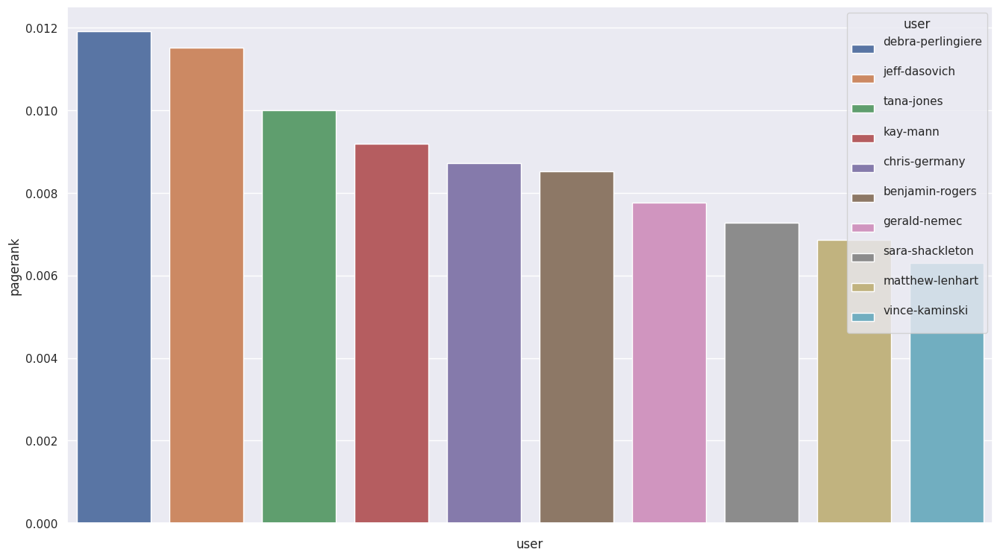

In [79]:
# TOP S close to 1
# Users that generate and keep alive conversations
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['pagerank'].sum().sort_values(by='pagerank', ascending=False).head(10)
sns.barplot(data=g, x='user', y='pagerank', hue='user', dodge=False).set(xticklabels=[]);


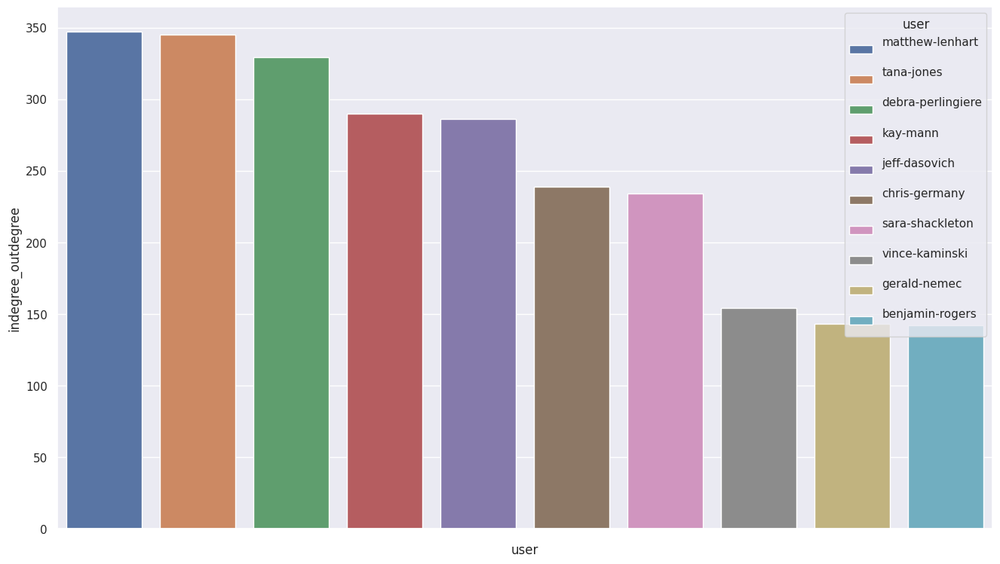

In [80]:
# Top in.out
# External Influencers
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['indegree_outdegree'].sum().sort_values(by='indegree_outdegree', ascending=False).head(10)
sns.barplot(data=g, x='user', y='indegree_outdegree', hue='user', dodge=False).set(xticklabels=[]);

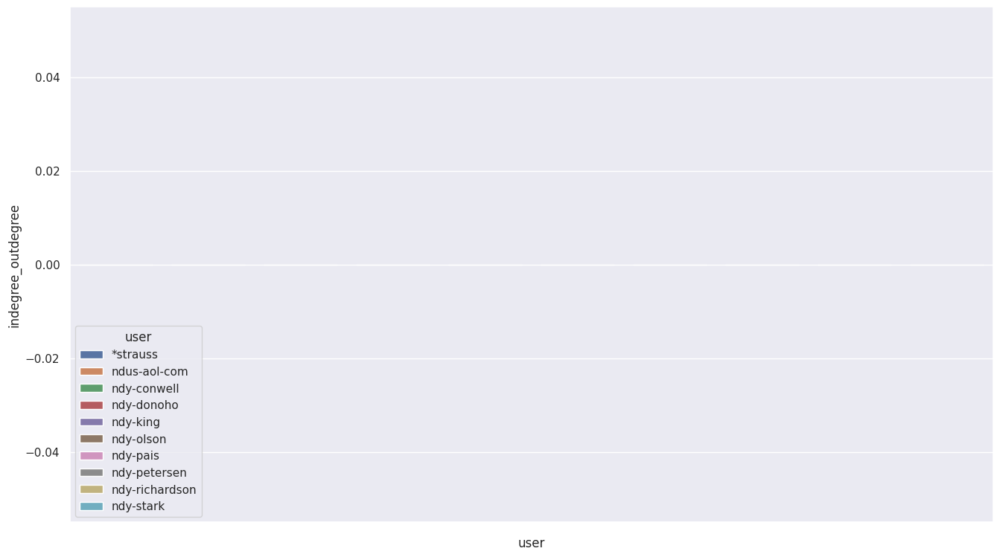

In [81]:
# S < 1
# Users that attempt to engage with others
sns.set(rc={'figure.figsize':(16,9)})

g = df_result.groupby('user', as_index=False)['indegree_outdegree'].sum().sort_values(by='indegree_outdegree', ascending=True).head(10)
sns.barplot(data=g, x='user', y='indegree_outdegree', hue='user', dodge=False).set(xticklabels=[]);

In [83]:
import anvil.server
import pandas as pd
import networkx as nx
import io

anvil.server.connect("server_3T63VQH2UCT35AUDHTPA6WXX-MK5MUVL5KEYOJCAW")

@anvil.server.callable
def calculate_metrics(file_content):
    # Parse CSV from file_content
    df = pd.read_csv(io.StringIO(file_content.decode('utf-8')), sep=';', encoding='utf8')
    df.columns = df.columns.str.lower()

    # Construct edge list from DataFrame
    messagesDF = df[['user', 'replytoauthor']]
    edgesDF = messagesDF.dropna(subset=['replytoauthor'])
    edgesDFWeight = edgesDF.groupby(['user', 'replytoauthor']).size().reset_index(name='weight')

    # Create directed graph from edge list
    G = nx.from_pandas_edgelist(edgesDFWeight, source='user', target='replytoauthor', edge_attr='weight', create_using=nx.DiGraph)

    # Calculate social network analysis metrics
    communities = getGraphCommunities(G)
    pagerank = getNodesPageRank(G)
    betweenness = getNodesCentralityBetwenness(G)
    indegree_outdegree = getNodesIndegreeOutdegree(G)

    # Merge results into DataFrame
    df_result = pd.DataFrame(
        {
            'user': list(G.nodes),
            'community': [communities[str(v)] for v in G.nodes],
            'pagerank': [pagerank[str(v)] for v in G.nodes],
            'betweenness': [betweenness[str(v)] for v in G.nodes],
            'indegree_outdegree': [indegree_outdegree[str(v)] for v in G.nodes]
        }
    )

    return df_result.to_dict()

In [84]:
anvil.server.wait_forever()

KeyboardInterrupt: ignored